# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [40]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os
from itertools import chain
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans


In [4]:
# using SQLite Table to read data.
con = sqlite3.connect(r'''C:\Users\akash\ML\SUBMITTED ASSIGNMENT\mandatory\SVM\database.sqlite''') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 70000""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (70000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [5]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [6]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [7]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [8]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [9]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [10]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [11]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(62864, 10)

In [12]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

89.80571428571429

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [13]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [14]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [15]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(62862, 10)


1    52600
0    10262
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [16]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

Our dogs just love them.  I saw them in a pet store and a tag was attached regarding them being made in China and it satisfied me that they were safe.
A truly wonderfull chutney from Southern Africa...Very nice on Currys, BBQ meats and Boerworse subs.
Sprout seed mix arrived very promptly and in great condition.  I needed them for our local farmers market and will be ordering more very soon.
THIS Cutter Insect Repellent with Picaridin is safer and less strong odor that DEET products.  It was not on retail stores this Summer (2011)in my area of the country.  Amazon was the only place where I could find it.  If you are faced with a dense mosquito population, pour in on legs on knees & below allowing it to run into socks.  Just spraying it will often not give full saturation and bugs have a way of finding that bare spot.  DEET products are available everywhere and may last longer, but read the warnings about the risk of long term or heavy dose of  DEET.


In [17]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

Our dogs just love them.  I saw them in a pet store and a tag was attached regarding them being made in China and it satisfied me that they were safe.


In [18]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

Our dogs just love them.  I saw them in a pet store and a tag was attached regarding them being made in China and it satisfied me that they were safe.
A truly wonderfull chutney from Southern Africa...Very nice on Currys, BBQ meats and Boerworse subs.
Sprout seed mix arrived very promptly and in great condition.  I needed them for our local farmers market and will be ordering more very soon.
THIS Cutter Insect Repellent with Picaridin is safer and less strong odor that DEET products.  It was not on retail stores this Summer (2011)in my area of the country.  Amazon was the only place where I could find it.  If you are faced with a dense mosquito population, pour in on legs on knees & below allowing it to run into socks.  Just spraying it will often not give full saturation and bugs have a way of finding that bare spot.  DEET products are available everywhere and may last longer, but read the warnings about the risk of long term or heavy dose of  DEET.


In [19]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [20]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Sprout seed mix arrived very promptly and in great condition.  I needed them for our local farmers market and will be ordering more very soon.


In [21]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

Our dogs just love them.  I saw them in a pet store and a tag was attached regarding them being made in China and it satisfied me that they were safe.


In [22]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Sprout seed mix arrived very promptly and in great condition I needed them for our local farmers market and will be ordering more very soon 


In [23]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [24]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████████████████████████████████████████████████████████████████████| 62862/62862 [00:17<00:00, 3695.27it/s]


In [25]:
preprocessed_reviews[1500]

'sprout seed mix arrived promptly great condition needed local farmers market ordering soon'

<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

In [26]:
ProcessedSummary=[]
for sentance in tqdm(final['Summary'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    ProcessedSummary.append(sentance.strip())

 38%|███████████████████████████▉                                              | 23768/62862 [00:04<00:07, 5557.98it/s]C:\Users\akash\Anaconda3\lib\site-packages\bs4\__init__.py:219: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
 75%|███████████████████████████████████████████████████████▍                  | 47101/62862 [00:08<00:02, 5613.51it/s]C:\Users\akash\Anaconda3\lib\site-packages\bs4\__init__.py:219: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
 97%|███████████████████████████████████████████████████████████████████████▉  | 61118/62862 [00:10<00:00, 5606.85it/s]C:\Users\akash\Anaconda3\lib\site-packages\bs4\__init__.py:219: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle

In [27]:
combinedData=[]
for i in range(len(ProcessedSummary)):
    combinedData.append(preprocessed_reviews[i] + " " + ProcessedSummary[i])

In [28]:
import random
xTrain=random.sample(combinedData,50000)

In [29]:
len(xTrain)

50000

# [4] Featurization

## [4.1] BAG OF WORDS

In [30]:
#BoW
count_vect = CountVectorizer() #in scikit-learn
count_vect.fit(xTrain)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)

final_counts = count_vect.transform(xTrain)
print("the type of count vectorizer ",type(final_counts))
print("the shape of out text BOW vectorizer ",final_counts.get_shape())
print("the number of unique words ", final_counts.get_shape()[1])

some feature names  ['aa', 'aaa', 'aaaa', 'aaaaa', 'aaaaaaaaaaaa', 'aaaaaaaaaaaaaaa', 'aaaaaaahhhhhh', 'aaaaaagh', 'aaaaaawwwwwwwwww', 'aaaaah']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (50000, 43172)
the number of unique words  43172


## [4.2] Bi-Grams and n-Grams.

In [31]:
#bi-gram, tri-gram and n-gram

#removing stop words like "not" should be avoided before building n-grams
# count_vect = CountVectorizer(ngram_range=(1,2))
# please do read the CountVectorizer documentation http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

# you can choose these numebrs min_df=10, max_features=5000, of your choice
count_vect = CountVectorizer(ngram_range=(1,4), min_df=50,max_features=1000)
count_vect.fit(xTrain)
final_bigram_counts =count_vect.transform(xTrain)
#final_bigram_counts_test =count_vect.transform(xTest)
featuresBOW =count_vect.get_feature_names()
print("the type of count vectorizer ",type(final_bigram_counts))
print("the shape of out text BOW vectorizer ",final_bigram_counts.get_shape())
print("the number of unique words including both unigrams and bigrams ", final_bigram_counts.get_shape()[1])


the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (50000, 1000)
the number of unique words including both unigrams and bigrams  1000


## [4.3] TF-IDF

In [32]:
modelText=TfidfVectorizer(ngram_range=(1,4),min_df=50,max_features=1000)
modelText.fit(xTrain)
sparseTFIDFTrain=modelText.transform(xTrain)

#getting features
featuresTFIDF=modelText.get_feature_names()
print("total no. of features are")
print(len(featuresTFIDF))
resultTfidf=featuresTFIDF

total no. of features are
1000


## [4.4] Word2Vec

In [33]:
# Train your own Word2Vec model using your own text corpus
list_of_sentance_train=[]
for sentance in xTrain:
    list_of_sentance_train.append(sentance.split())
    
modelW2V=Word2Vec(list_of_sentance_train,min_count=5,size=50)
w2v_words=list(modelW2V.wv.vocab)

In [34]:
list_of_sentance_train=[]
for sentance in xTrain:
    list_of_sentance_train.append(sentance.split())
    
#for train data
sent_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance_train): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = modelW2V.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_train.append(sent_vec)
print(len(sent_vectors_train))


100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [00:58<00:00, 847.66it/s]


50000


## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

In [35]:
#for train data
sent_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance_train): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = modelW2V.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_train.append(sent_vec)
print(len(sent_vectors_train))


100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [00:57<00:00, 862.51it/s]


50000


#### [4.4.1.2] TFIDF weighted W2v

In [36]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
#model = TfidfVectorizer()
#tf_idf_matrix = model.fit_transform(preprocessed_reviews)
#tf_idf_matrix=final_tf_idf_train

# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(resultTfidf,list(modelText.idf_)))

In [37]:
# TF-IDF weighted Word2Vec
#tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
tfidf_feat=resultTfidf
tfidf_sent_vectors_train = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance_train): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = modelW2V.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_train.append(sent_vec)
    row += 1
    

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [01:19<00:00, 626.99it/s]


# Applying: K-Means, Agglomerative & DBSCAN Clustering

## [5.1] K-Means Clustering

100%|███████████████████████████████████████████████████████████████████████████████| 10/10 [1:50:29<00:00, 601.32s/it]


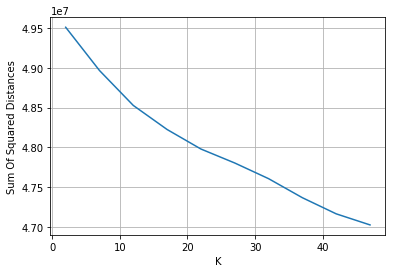

In [41]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler(with_mean=False)
scaler.fit(final_bigram_counts)
stdData=scaler.transform(final_bigram_counts)

SumOfSquaredDistances=[]
labels=[]
kValues=[i for i in range (2,50,5)]
for k in tqdm(kValues):
    kmeans=KMeans(n_clusters=k,init="k-means++",max_iter=500).fit(stdData)
    SumOfSquaredDistances.append(kmeans.inertia_)

plt.plot(kValues,SumOfSquaredDistances)
plt.xlabel("K")
plt.ylabel("Sum Of Squared Distances")
plt.grid()    

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [42]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
scaler=StandardScaler(with_mean=False)
scaler.fit(final_bigram_counts)
stdData=scaler.transform(final_bigram_counts)

In [43]:
stdData.shape

(50000, 1000)

In [44]:
from tqdm import tqdm
from sklearn.cluster import KMeans

100%|███████████████████████████████████████████████████████████████████████████████| 10/10 [1:42:03<00:00, 830.20s/it]


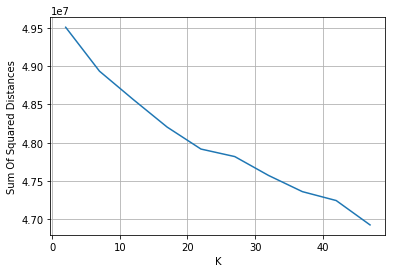

In [45]:
SumOfSquaredDistances=[]
labels=[]
kValues=[i for i in range (2,50,5)]
for k in tqdm(kValues):
    kmeans=KMeans(n_clusters=k,init="k-means++",max_iter=500).fit(stdData)
    SumOfSquaredDistances.append(kmeans.inertia_)

plt.plot(kValues,SumOfSquaredDistances)
plt.xlabel("K")
plt.ylabel("Sum Of Squared Distances")
plt.grid()    

##### observation:

nothing could be colcluded as  graph is continuous decreasing therefore assuming n_clusters=2

In [46]:
kmeans=KMeans(n_clusters=2,init="k-means++",max_iter=300)
ind=kmeans.fit_predict(stdData)

In [47]:
ind.shape

(50000,)

### creating list of words present in a review

In [48]:
ReviewWords=[]
for i in range(len(xTrain)):
    sent=[]
    for words in xTrain[i].split():
        sent.append(words)
    ReviewWords.append(sent)

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [49]:
Data0=[]
Data1=[]
for i in range(ind.shape[0]):
    if ind[i]==0:
        Data0.append(ReviewWords[i])
    else:
        Data1.append(ReviewWords[i])

In [50]:
DataConv0=list(chain.from_iterable(Data0))

In [51]:
DataConv1=list(chain.from_iterable(Data1))

## for cluster 0

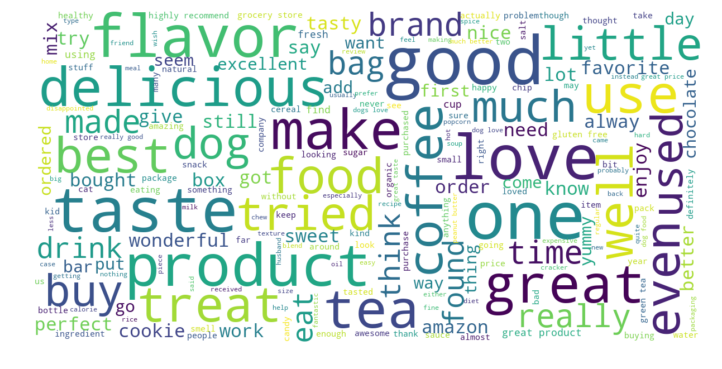

In [52]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
wordcloud2 = WordCloud( background_color='white',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1).generate(' '.join(DataConv0))
# Display the generated image:
fig = plt.figure(1, figsize=(12, 12))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

#### observation

major words are:flavor,delicious,good,taste,sweet,great.

this cluster mainly describes about the good charcteristic of food which is mainly positive.

## for cluster 1

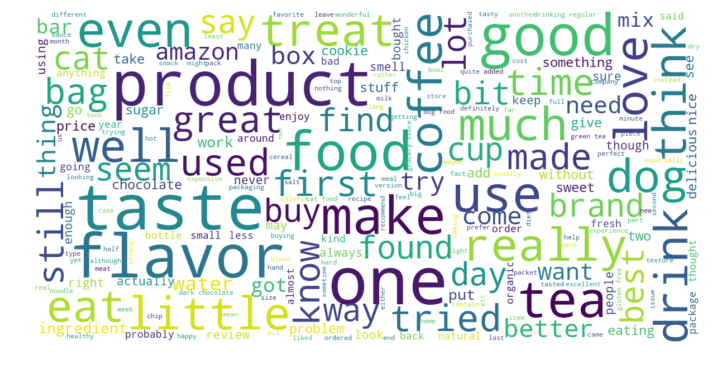

In [53]:

wordcloud2 = WordCloud( background_color='white',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1).generate(' '.join(DataConv1))
# Display the generated image:
fig = plt.figure(1, figsize=(12, 12))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

#### observation:

major words are: flavor,good,coffee,drink,cat,dog

this cluster mainly describe about the good characteristic of the food , the drinks like tea and coffee as well food for animals like dog and cat.

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [54]:
#standardizing the data
scaler=StandardScaler(with_mean=False)
scaler.fit(sparseTFIDFTrain)
stdData=scaler.transform(sparseTFIDFTrain)

100%|████████████████████████████████████████████████████████████████████████████| 10/10 [13:14:10<00:00, 12622.68s/it]


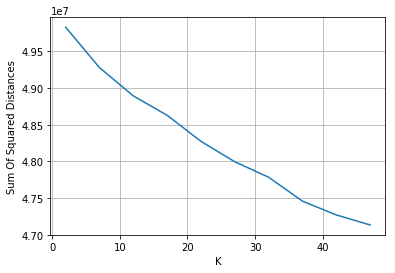

In [55]:
SumOfSquaredDistances=[]
labels=[]
kValues=[i for i in range (2,50,5)]
for k in tqdm(kValues):
    kmeans=KMeans(n_clusters=k,init="k-means++",max_iter=300).fit(stdData)
    SumOfSquaredDistances.append(kmeans.inertia_)

plt.plot(kValues,SumOfSquaredDistances)
plt.xlabel("K")
plt.ylabel("Sum Of Squared Distances")
plt.grid()    

##### observation:

 graph is continuously decreasing therefore picking k=5

### fitting the data with best hyperparameter

In [56]:
kmeans=KMeans(n_clusters=5)
ind=kmeans.fit_predict(stdData)

In [57]:
HDict={i:np.where(kmeans.labels_==i) for i in range(kmeans.n_clusters)}

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

word cloud for cluster k=0


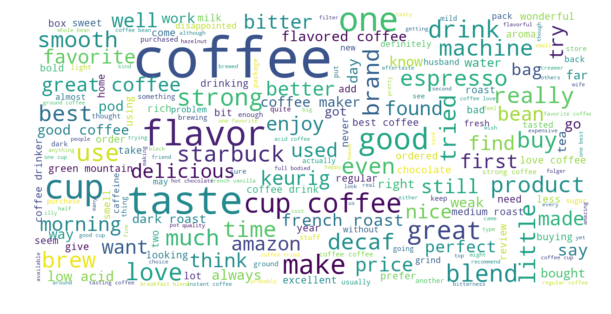

word cloud for cluster k=1


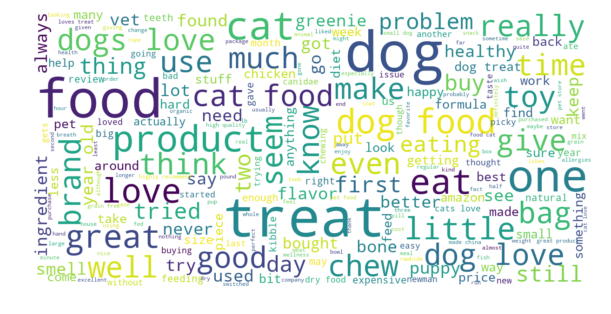

word cloud for cluster k=2


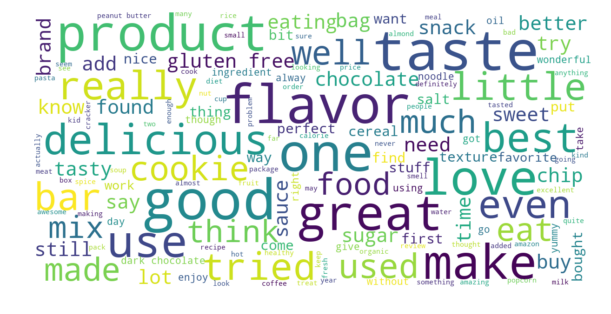

word cloud for cluster k=3


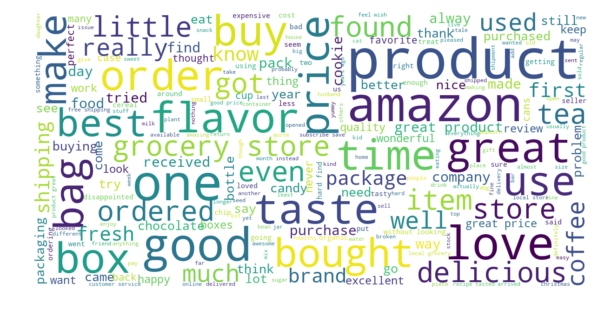

word cloud for cluster k=4


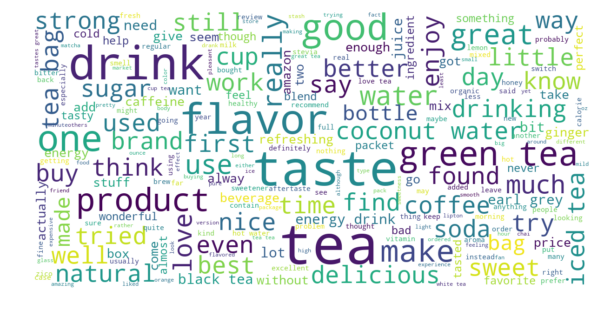

In [58]:
for k,v in HDict.items():
    print("word cloud for cluster k={}".format(k))
    Data=[]
    for i in v:
        for j in i:
            Data.append(ReviewWords[j])
        DataConv=list(chain.from_iterable(Data))
        wordcloud2 = WordCloud( background_color='white',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1).generate(' '.join(DataConv))
        # Display the generated image:
        fig = plt.figure(1, figsize=(10, 10))
        plt.imshow(wordcloud2, interpolation='bilinear')
        plt.axis("off")
        plt.show()

### observation:

##### cluster k=0:

major words are: brew,starbuck,strong,drink,keuring
    
This cluster is mainly focused towards the drink section

##### cluster k=1:

major words are:food,dog,cat,chew,feed,puppy,bone

This cluster comprises of reviews which are on animal food like dog ,cat etc


##### cluster k=2:

major words are:milk,glutan free,cereal,mix,bar,good

This cluster comprises of reviews which are about the health suppliments like protein shakes.Because most of the words describe about its mixability,its taste and protein content.

##### cluster k=3:

major words are:box,bag,product,store,package,grocery

This cluster comprises of reviews which are elaborating about the packaging of the product.

##### cluster k=4:

major words are: tea,green tea,black tea,coconut water

This cluster comprises of reviews which are mainly focused on beverages.

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [59]:
scaler=StandardScaler(with_mean=False)
scaler.fit(sent_vectors_train)
stdData=scaler.transform(sent_vectors_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [06:42<00:00, 58.82s/it]


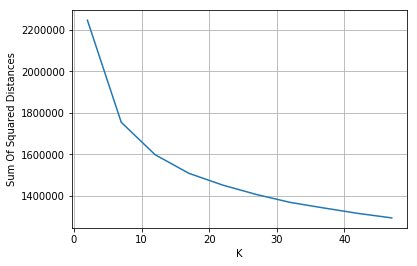

In [60]:
SumOfSquaredDistances=[]
labels=[]
kValues=[i for i in range (2,50,5)]
for k in tqdm(kValues):
    kmeans=KMeans(n_clusters=k,init="k-means++",max_iter=300).fit(stdData)
    SumOfSquaredDistances.append(kmeans.inertia_)

plt.plot(kValues,SumOfSquaredDistances)
plt.xlabel("K")
plt.ylabel("Sum Of Squared Distances")
plt.grid()    

choosing k=5 as the graph is continuosly decreasing after that

### fitting the data with best hyperparameter

In [61]:
kmeans=KMeans(n_clusters=5,init="k-means++",max_iter=300)
ind=kmeans.fit_predict(stdData)

HDict={i:np.where(kmeans.labels_==i) for i in range(kmeans.n_clusters)}

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

word cloud for cluster k=0


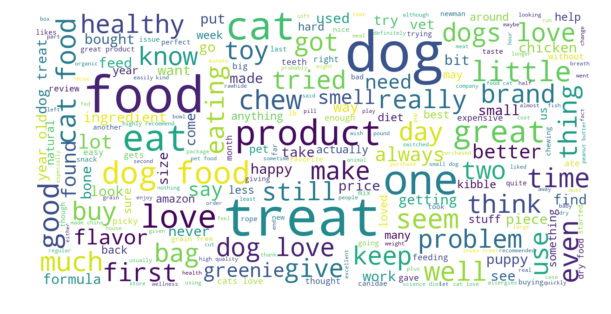

word cloud for cluster k=1


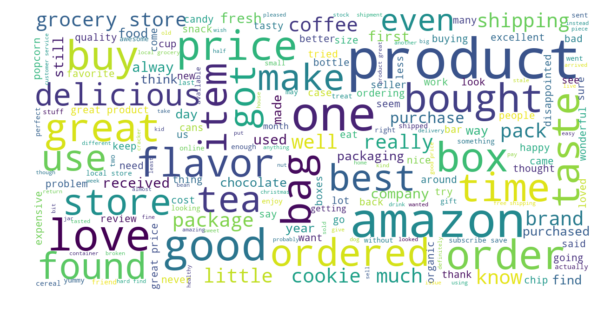

word cloud for cluster k=2


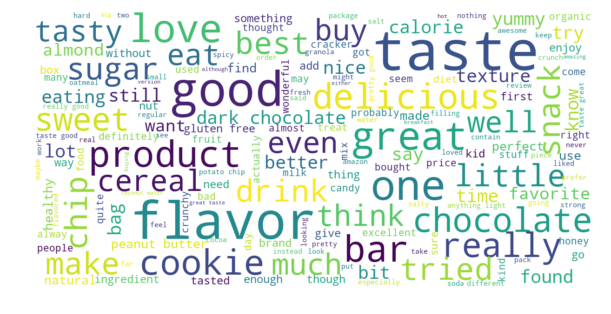

word cloud for cluster k=3


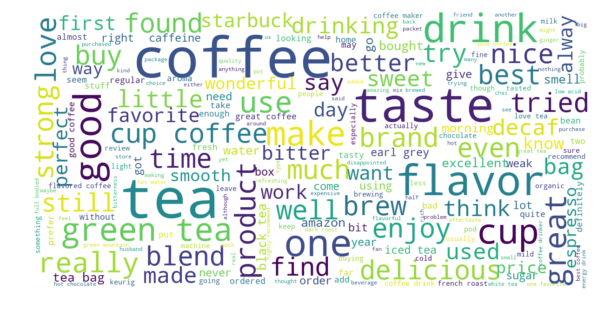

word cloud for cluster k=4


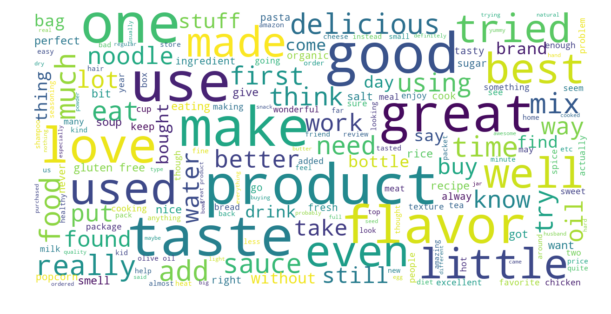

In [62]:
for k,v in HDict.items():
    print("word cloud for cluster k={}".format(k))
    Data=[]
    for i in v:
        for j in i:
            Data.append(ReviewWords[j])
        DataConv=list(chain.from_iterable(Data))
        wordcloud2 = WordCloud( background_color='white',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1).generate(' '.join(DataConv))
        # Display the generated image:
        fig = plt.figure(1, figsize=(10, 10))
        plt.imshow(wordcloud2, interpolation='bilinear')
        plt.axis("off")
        plt.show()

#### observation:

##### for cluster k=0:

major words are:cat,hard,toy,year old dog

It mainly contains the reviews which describe food for animals.

##### for cluster k=1 

major words are:box,bag,product,store,package,grocery

This cluster comprises of reviews which are elaborating about the packaging of the product.

##### for cluster k=2

major words are:milk,glutan free,cereal,mix,bar,good

This cluster comprises of reviews which are about the health suppliments like protein shakes.Because most of the words describe about its mixability,its taste and protein content.

##### for cluster k=3 

major words are: tea,green tea,black tea,coconut water

This cluster comprises of reviews which are mainly focused on beverages.

##### for cluster k=4

major words are: noodles, sause ,pasta ,rice

this cluster contains the review about chinese food.

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [63]:
scaler=StandardScaler(with_mean=False)
scaler.fit(tfidf_sent_vectors_train )
stdData=scaler.transform(tfidf_sent_vectors_train)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [06:46<00:00, 61.14s/it]


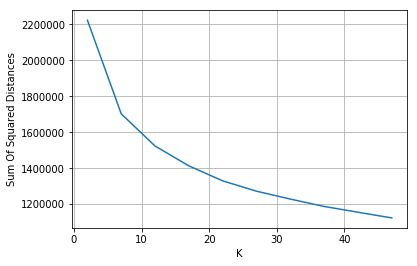

In [64]:
SumOfSquaredDistances=[]
labels=[]
kValues=[i for i in range (2,50,5)]
for k in tqdm(kValues):
    kmeans=KMeans(n_clusters=k,init="k-means++",max_iter=300).fit(stdData)
    SumOfSquaredDistances.append(kmeans.inertia_)

plt.plot(kValues,SumOfSquaredDistances)
plt.xlabel("K")
plt.ylabel("Sum Of Squared Distances")
plt.grid()    

choosing parameter k=5 as after that the graph is continuously decreasing

### fitting the data with best hyperparameter

In [65]:
kmeans=KMeans(n_clusters=5,init="k-means++",max_iter=300)
ind=kmeans.fit_predict(stdData)

HDict={i:np.where(kmeans.labels_==i) for i in range(kmeans.n_clusters)}

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

word cloud for cluster k=0


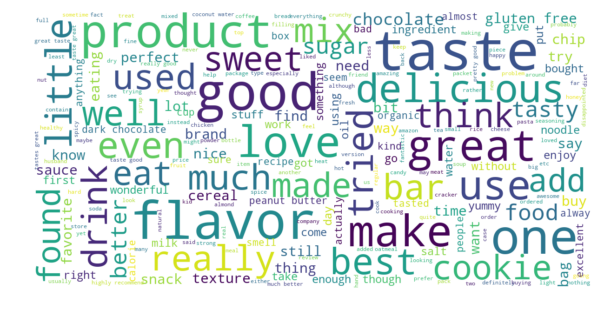

word cloud for cluster k=1


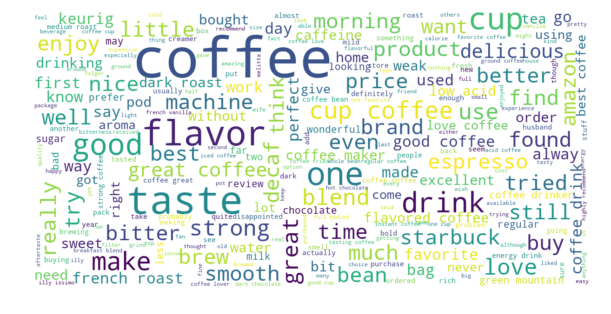

word cloud for cluster k=2


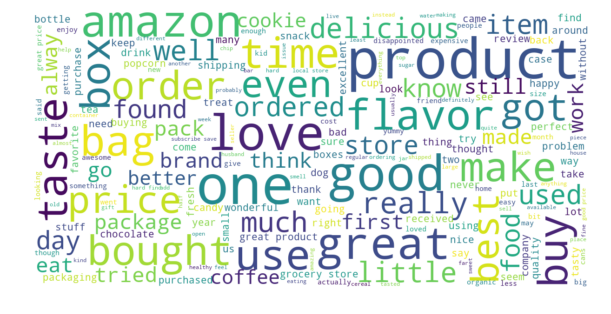

word cloud for cluster k=3


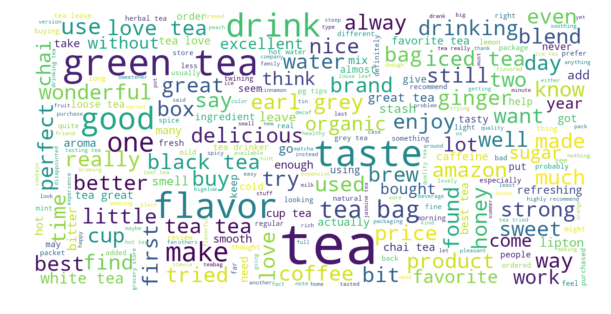

word cloud for cluster k=4


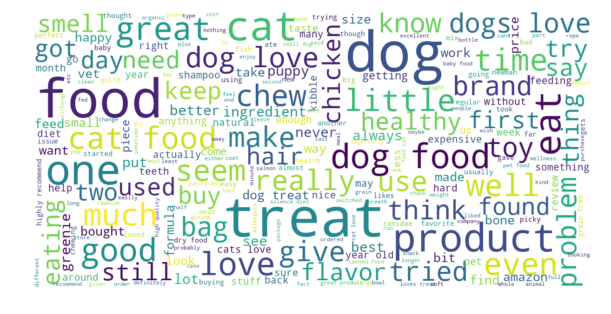

In [66]:
for k,v in HDict.items():
    print("word cloud for cluster k={}".format(k))
    Data=[]
    for i in v:
        for j in i:
            Data.append(ReviewWords[j])
        DataConv=list(chain.from_iterable(Data))
        wordcloud2 = WordCloud( background_color='white',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1).generate(' '.join(DataConv))
        # Display the generated image:
        fig = plt.figure(1, figsize=(10, 10))
        plt.imshow(wordcloud2, interpolation='bilinear')
        plt.axis("off")
        plt.show()

#### observation:

for cluster k=0:

major words->cookie,sweet,choclate,glutan free

context->choclate and sweets.



for cluster k=1:

major words->box,bag,product,store,package,grocery

context->This cluster comprises of reviews which are elaborating about the packaging of the product.



for cluster k=2:

major words->tea,green tea,black tea,coconut water

context->This cluster comprises of reviews which are mainly focused on beverages.



for cluster k=3:

major words->tea,teabag,ginger,chai

context->extreme focus on tea and its flavours.



for cluster k=4:
major words->dog,chicken,cat,feed,bit.
context->animal food

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [67]:
#sampling 1500 pts for agglomerative clustering
from random import sample
xTrainAgg=sample(xTrain,6000)

In [68]:
len(xTrainAgg)

6000

In [69]:
#rebuilding models as we have taken 1500 datapoints
model=TfidfVectorizer(ngram_range=(1,4),min_df =10,max_features=1000)
model.fit(xTrainAgg)
model.transform(xTrainAgg)

features=model.get_feature_names()
#creating dictionary for features:idf values
dictionary=dict(zip(features,model.idf_))

In [70]:
wordsList=[]
for sent in xTrainAgg:
    wordsList.append(sent.split())

In [73]:

#building W2v model on google news data
from gensim.models import KeyedVectors
#KeyedVectors.load_word2vec_format("")
#modelw2v=Word2Vec(wordsList, size=50, min_count=3)
#building vocabulary
#vocab=list(modelw2v.wv.vocab)

In [74]:
from gensim.models import KeyedVectors
# the word2vec model is saved as binary and not as any encoded string. Therefore, just setting binary = True should work in all cases
modelw2v=KeyedVectors.load_word2vec_format(r"C:\Users\akash\ML\SUBMITTED ASSIGNMENT\mandatory\GoogleNews-vectors-negative300.bin.gz",encoding="latin-1", binary = True)


In [75]:
vocab=list(modelw2v.wv.vocab)

In [76]:
finalAvg=[]
for sentence in wordsList:
    tempVec=np.zeros(300)
    count=0
    for word in sentence:
        if word in vocab:
            vec=modelw2v[word]
            tempVec+=vec
            count+=1
    if count!=0:
        finalAvg.append(tempVec/count)

In [77]:
len(finalAvg)

6000

In [78]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

TOAL NUMBER OF CLUSTERS K =2
wordcloud for cluster 0


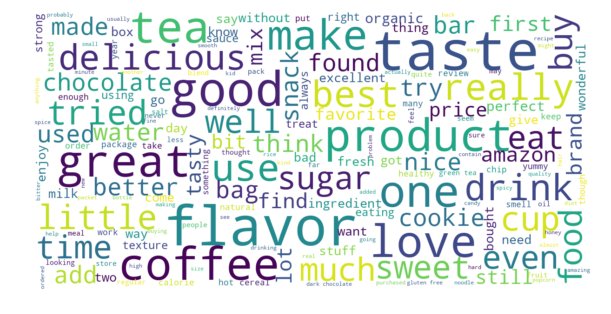

wordcloud for cluster 1


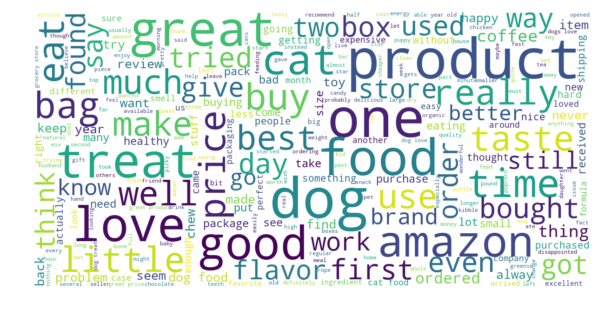

TOAL NUMBER OF CLUSTERS K =5
wordcloud for cluster 0


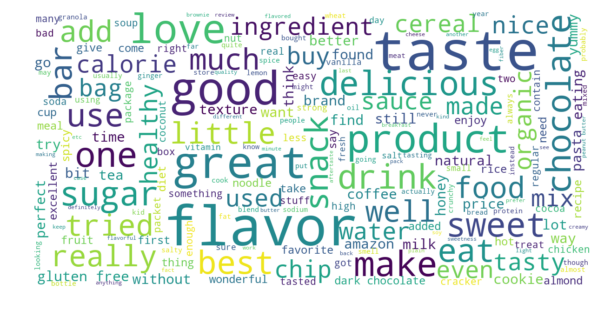

wordcloud for cluster 1


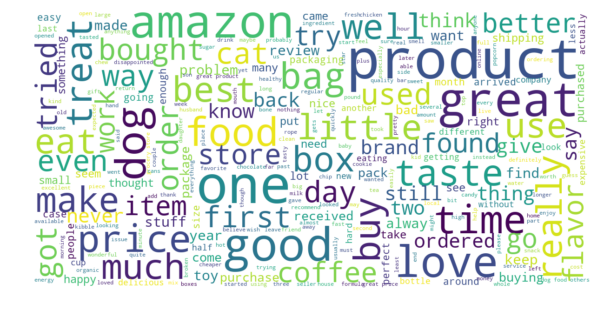

wordcloud for cluster 2


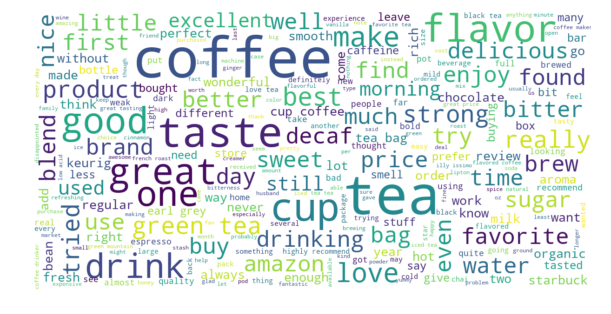

wordcloud for cluster 3


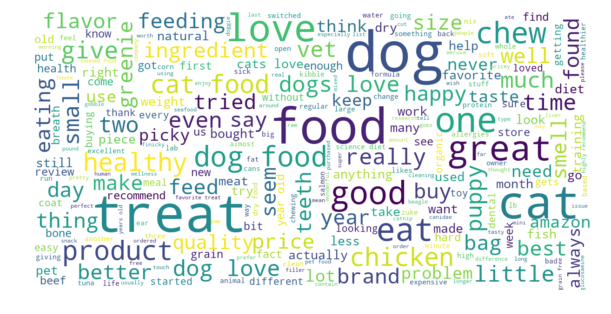

wordcloud for cluster 4


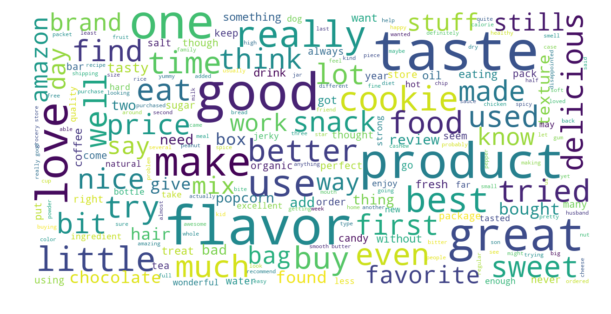

TOAL NUMBER OF CLUSTERS K =7
wordcloud for cluster 0


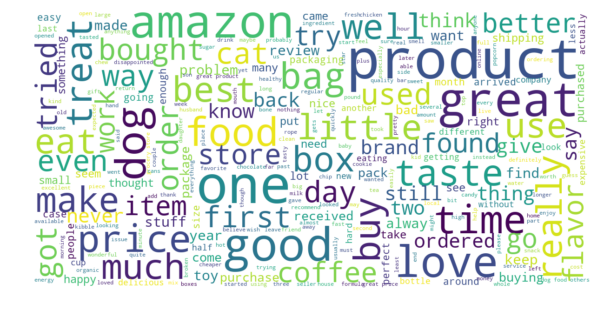

wordcloud for cluster 1


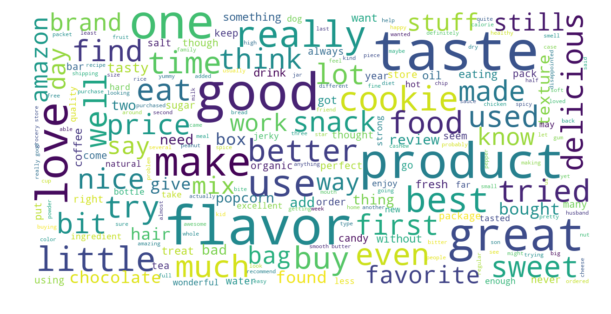

wordcloud for cluster 2


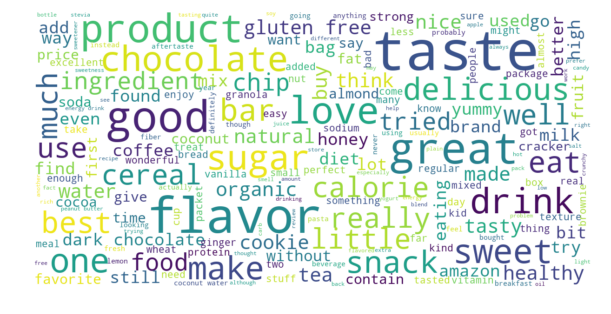

wordcloud for cluster 3


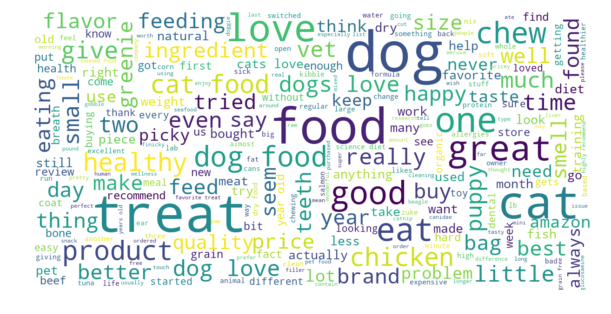

wordcloud for cluster 4


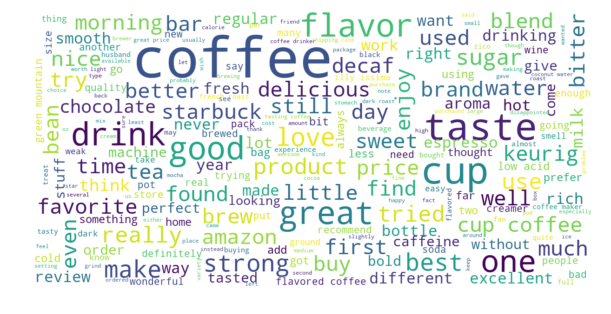

wordcloud for cluster 5


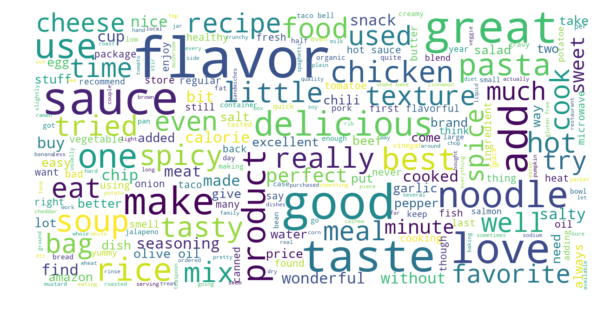

wordcloud for cluster 6


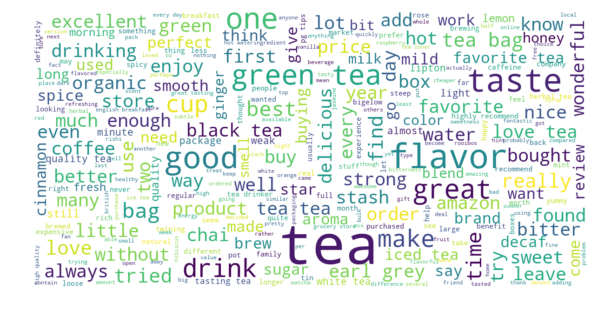

In [79]:
from sklearn.cluster import AgglomerativeClustering
hyp=[2,5,7]
for k in hyp:
    print("TOAL NUMBER OF CLUSTERS K ={}".format(k))
    agg=AgglomerativeClustering(n_clusters=k)
    labels=agg.fit_predict(finalAvg)
    for i in np.unique(labels):
        print("wordcloud for cluster {}".format(i))
        indice=np.where(labels==i)
        Data=[]
        for j in indice:
            for k in j:
                Data.append(wordsList[k])
        DataConv=list(chain.from_iterable(Data))
        wordcloud2 = WordCloud( background_color='white',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1).generate(' '.join(DataConv))
        # Display the generated image:
        fig = plt.figure(1, figsize=(10, 10))
        plt.imshow(wordcloud2, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        

### observation:

##### when k=2

for k=0:

context->choclate,coffe,tea,snack.

for k=1:

context->about product from amzaon.and product of cat and dogs



##### when k=5:

for k=0:

context->snacks,chips and sauses.


for k=1:

context->about the products from amazaon and their characteristic.


for k=2:


context->coffee ,tea and all other beverages.


for k=3:


context-> all pets food.


for k=4:


context->characteristic of food that it is good and all.


##### when k=7:

for k=0:

context->positive reviews of foods.


for k=1:

context->organic charact. of food and its calories.


for k=2:

context->contents of food lie sodium,protein etc.


for k=3:

context->pet food.


for k=4:

context->beverages.


for k=5:

context->chinese food + ingredients of the food.


for k=6:

context->beverages.



### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [80]:
finalTFIDFw2v=[]
for sentence in wordsList:
    tempVec=np.zeros(300)
    weight=0
    for word in sentence:
        if word in vocab and word in features:
            vec=modelw2v[word]
            tfidf=dictionary[word]*sentence.count(word)/len(sentence)
            tempVec+=vec*tfidf
            weight+=tfidf
    if weight!=0:
        finalTFIDFw2v.append(tempVec/count)

### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

TOAL NUMBER OF CLUSTERS K =2
wordcloud for cluster 0


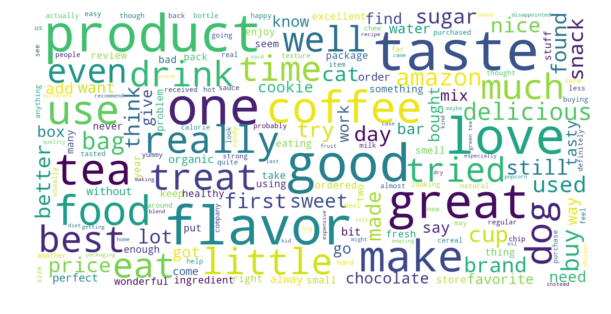

wordcloud for cluster 1


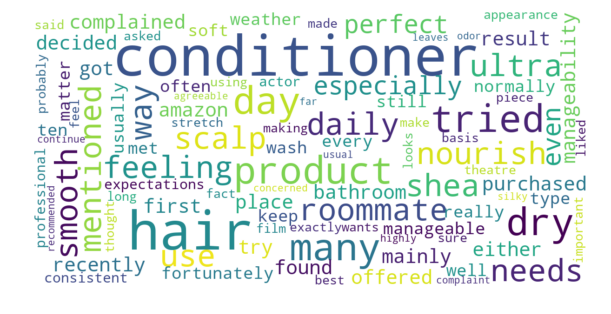

TOAL NUMBER OF CLUSTERS K =5
wordcloud for cluster 0


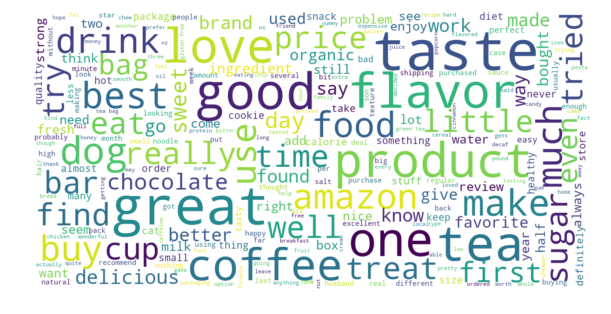

wordcloud for cluster 1


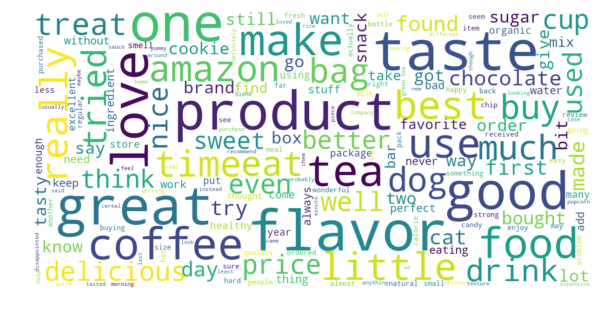

wordcloud for cluster 2


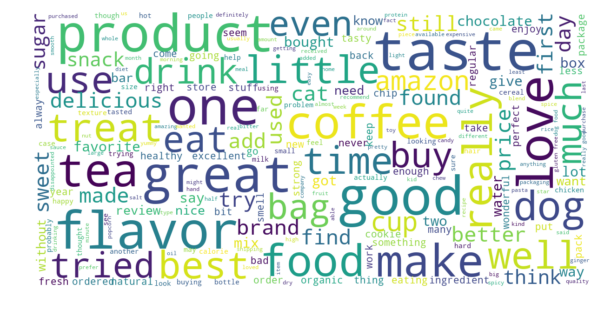

wordcloud for cluster 3


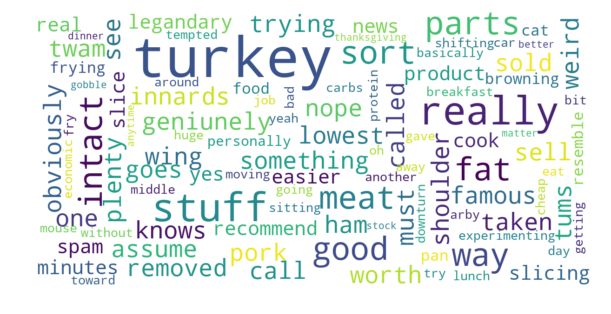

wordcloud for cluster 4


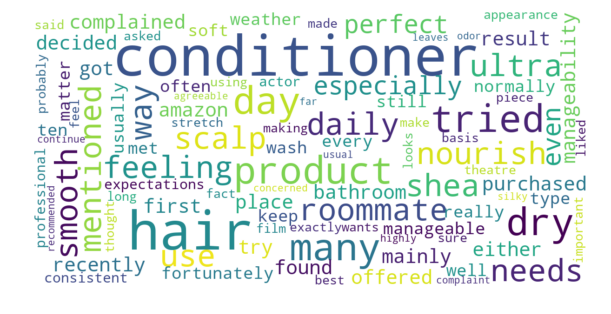

TOAL NUMBER OF CLUSTERS K =7
wordcloud for cluster 0


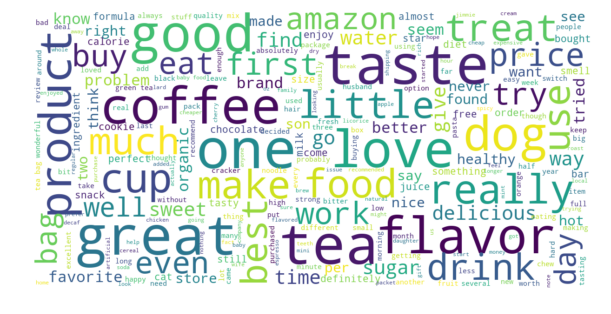

wordcloud for cluster 1


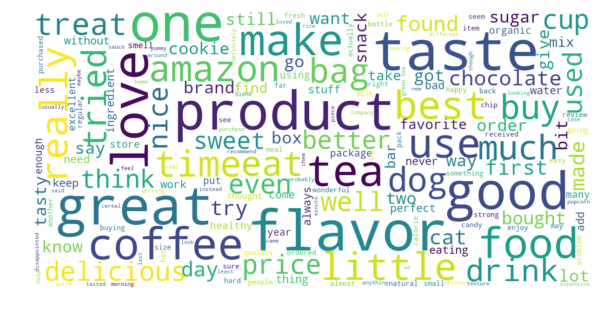

wordcloud for cluster 2


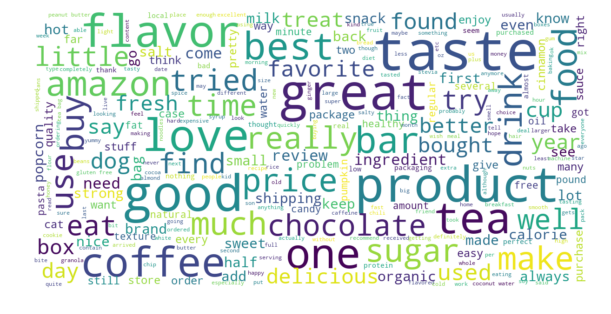

wordcloud for cluster 3


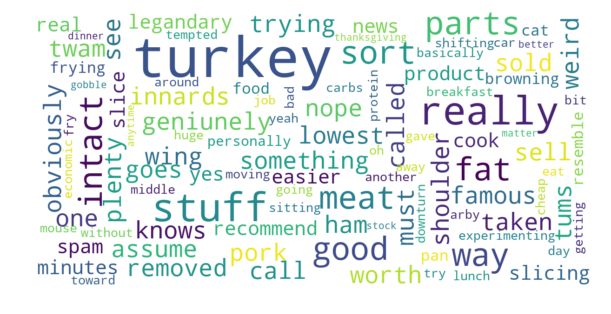

wordcloud for cluster 4


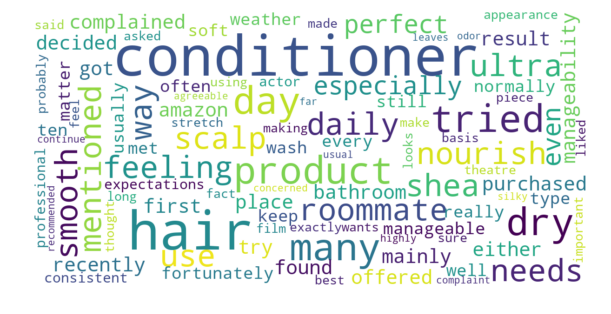

wordcloud for cluster 5


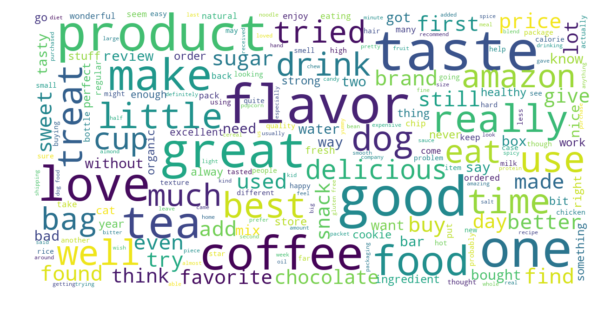

wordcloud for cluster 6


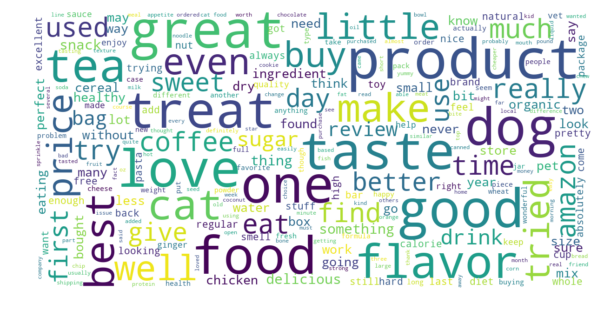

In [81]:
for k in hyp:
    print("TOAL NUMBER OF CLUSTERS K ={}".format(k))
    agg=AgglomerativeClustering(n_clusters=k)
    labels=agg.fit_predict(finalTFIDFw2v)
    for i in np.unique(labels):
        print("wordcloud for cluster {}".format(i))
        indice=np.where(labels==i)
        Data=[]
        for j in indice:
            for k in j:
                Data.append(wordsList[k])
        DataConv=list(chain.from_iterable(Data))
        wordcloud2 = WordCloud( background_color='white',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1).generate(' '.join(DataConv))
        # Display the generated image:
        fig = plt.figure(1, figsize=(10, 10))
        plt.imshow(wordcloud2, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        

#### observation:

##### when k=2

for k=0:
context->good char. of food + reviews of tea

for k=1:
context->scalp,hair conditioner,nourish. Every thing related to hair is present in this cluster

##### when k=5

for k=0:

context->good char. of food and also of tea and coffee

for k=1:

context->mainly focused on tea coffee and thier taste

for k=2:

context->mainly focused on tea coffee and thier taste

for k=3:

context->major words: turkey,twam,tums

for k=4:

context->scalp,hair conditioner,nourish. Every thing related to hair is present in this cluster


##### when k=7

for k=0:

context->mainly focused on tea coffee and thier taste

for k=1:

context->mainly focused on tea coffee and thier taste + cookies.

for k=2:

context->about the flavours of tea and coffee and its taste.

for k=3:

context->major words: turkey,twam,tums

for k=4:

context->scalp,hair conditioner,nourish. Every thing related to hair is present in this cluster

for k=5:

context->about the flavours of tea and coffee and its taste.

for k=6:

context->about the flavours of tea and coffee and its taste.

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [82]:

#minpoints are typically d+1 or d*2
min_points=301
knn=NearestNeighbors(n_neighbors=min_points)
knn.fit(finalAvg)

dist,ind=knn.kneighbors(finalAvg)

In [83]:
#ind represents the nearest point to the popluation matrix
ind[0,:]

array([   0, 5182, 2521, 1928,  698, 3075,  270, 5677, 3200, 3235, 2144,
       1409,  397, 3905,  308, 5996,   60,  102,  330, 1787, 2711, 3795,
       1907, 4960, 2432, 1523, 5523, 5333, 4128, 2532, 2332, 3580, 5424,
        851, 3849, 1718, 4526, 4492, 2171, 2509, 3435, 3958, 1480, 1511,
       2976, 2091, 1025, 5765, 2255, 2228, 3245, 2125, 4994, 1322, 3294,
          1, 2371, 1518,  905, 5999, 3753, 4787, 3472, 4298,  432, 4704,
       3945, 2077, 2906, 2141, 4588, 3064, 1375, 4330, 3327,   44, 5789,
        176, 1871, 2495, 1516, 2551,   22, 2707, 4985, 5796, 5670, 2050,
        779, 2296, 4380, 5019, 2749, 1458,  505, 4138, 3474, 5822, 1346,
       2434,  809, 1935,  367, 1691,   98,  218, 2058, 1178, 3736, 3109,
       4355, 5711, 4517, 3639, 4850, 4913, 3502, 5957, 2991, 1106, 3100,
       4637,  733, 5826, 3053, 2097, 4583, 4309, 2369, 4168, 2351, 2969,
       5886, 5248, 3616, 5695,   30, 2308, 5888, 3401, 5954, 3307, 5431,
       2493, 2458, 1230, 2386,  667,  633, 3123, 22

these are the nearest data points for the data point 0(total 301). 2501 is the nearest 301st data point to the data point 0

In [84]:
dist[0,:]

array([0.        , 0.5526487 , 0.56094713, 0.56251024, 0.56408467,
       0.56607348, 0.56953558, 0.57009268, 0.57042383, 0.57394122,
       0.57488045, 0.5756919 , 0.57816853, 0.57946547, 0.58584286,
       0.58762789, 0.58851839, 0.59010538, 0.5903628 , 0.59130324,
       0.59776303, 0.59779687, 0.59779706, 0.59914438, 0.60165839,
       0.60188026, 0.60193479, 0.60196672, 0.60235953, 0.60335419,
       0.6037897 , 0.60442995, 0.60492295, 0.60604499, 0.60775755,
       0.60867338, 0.60935261, 0.60942975, 0.60948002, 0.6099052 ,
       0.61030955, 0.61042061, 0.61162279, 0.61329657, 0.61340161,
       0.61394332, 0.61536688, 0.61592532, 0.6168165 , 0.61810666,
       0.61835874, 0.61859384, 0.6194446 , 0.62031616, 0.62070564,
       0.62084019, 0.620846  , 0.62164471, 0.62225024, 0.62246033,
       0.62331227, 0.62410396, 0.62471164, 0.62588083, 0.62597314,
       0.6264883 , 0.62725426, 0.62775403, 0.62777887, 0.62842565,
       0.62856943, 0.62873983, 0.62930755, 0.62938851, 0.62939

this is the distance of the data point 0 to the other datapoints(301NN). 0.89921617 is the distance between 0th data point and its 3011st Nearest Neighbor

#### sorting distances on the basis of the distances to the 301st nearest neighbor

In [85]:
sortDist=sorted(dist[:,min_points-1])
#total no. of data points
Datapoints=list(range(1,len(finalAvg)+1))

Text(0,0.5,'Distance of the Data points to its 301 NN')

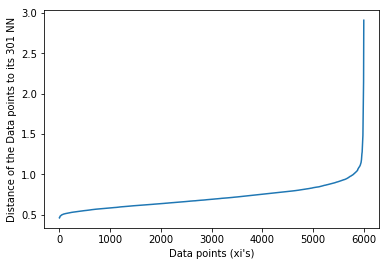

In [86]:
plt.plot(Datapoints,sortDist)
plt.xlabel("Data points (xi's)")
plt.ylabel("Distance of the Data points to its 301 NN")

In [87]:
db=DBSCAN(eps=1.0,min_samples=301)
labels=db.fit_predict(finalAvg)

In [88]:
np.unique(labels)

array([-1,  0], dtype=int64)

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

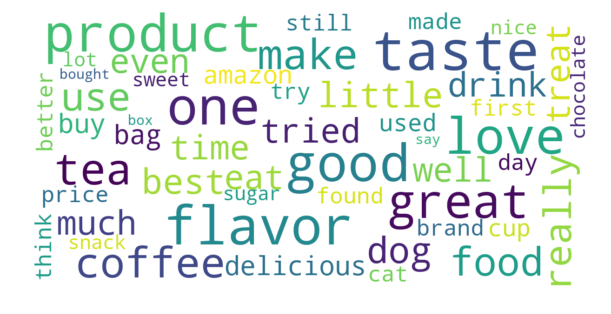

In [89]:
i=0
indice=np.where(labels==i)
for j in indice:
    Data=[]
    for k in j:
        Data.append(wordsList[k])
DataConv=list(chain.from_iterable(Data))
wordcloud2 = WordCloud( background_color='white',
max_words=50,
max_font_size=40, 
scale=3,
random_state=1).generate(' '.join(DataConv))
# Display the generated image:
fig = plt.figure(1, figsize=(10, 10))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()
        

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [90]:
knn=NearestNeighbors(n_neighbors=min_points)
knn.fit(finalTFIDFw2v)

dist,ind=knn.kneighbors(finalTFIDFw2v)

In [91]:
#ind represents the nearest point to the popluation matrix
ind[0,:]

array([   0, 3903, 4586, 2075, 3793, 5995, 4218,  611, 4957,  834, 2123,
        674, 3073,  850, 2139, 2904, 2708, 5818,  330, 4666, 2512,   60,
       4047, 2937, 4420,  218,  708, 3098, 1229, 3248, 2786, 3993, 3433,
       3122,  247,  327, 2974, 4429, 1786,  270, 2330, 3325,  808,  893,
       4197, 2384,  308, 4847, 1408,  527, 4141, 3233,  279, 4817,  697,
       2321, 5329, 2566, 3056, 1632, 1641, 4547, 5725, 4674, 2493, 2079,
       3068,  423,  416, 5309, 4092, 3751, 2956,  666, 5740, 2560, 2380,
       1130, 4745, 3856, 1576, 3438, 3015,  237, 4307, 2847,  102, 1914,
        650,   22,  432, 4340, 3243, 5160, 4654, 3842,  446, 3246, 2198,
       5792, 1926, 5382,  142, 1636,  523, 4475, 2095, 4349, 3523, 2644,
       5332, 4355, 3360, 3961, 4457,  550, 5288, 1573, 5260, 5525, 4790,
        427, 5541, 5060, 5733, 1739, 1801,  970, 3974, 2720, 2200, 3213,
        632, 4702, 3292, 5666,  359,  504, 3399, 1625, 5841, 4884, 1236,
       2816, 2876,  989,  367, 2628, 3358, 1197,  7

these are the nearest data points for the data point 0(total 301). 2501 is the nearest 301st data point to the data point 0

In [92]:
dist[0,:]

array([0.        , 0.12688942, 0.13614853, 0.13627505, 0.13668899,
       0.13744525, 0.14299933, 0.1439099 , 0.14513836, 0.14873438,
       0.14900771, 0.14926533, 0.15038331, 0.15077472, 0.151708  ,
       0.15215438, 0.15255116, 0.15525235, 0.15550864, 0.15558978,
       0.15813398, 0.15826626, 0.15832234, 0.15863885, 0.15869778,
       0.15901639, 0.15968416, 0.16037364, 0.16063688, 0.16113543,
       0.16203603, 0.16270158, 0.16271263, 0.16271267, 0.16346762,
       0.16357975, 0.16393963, 0.16421509, 0.16459522, 0.16469544,
       0.1646956 , 0.1648365 , 0.16520122, 0.16555207, 0.16601801,
       0.16617676, 0.16648003, 0.16653508, 0.16663034, 0.16674957,
       0.16686675, 0.1669257 , 0.16692903, 0.16696037, 0.16863438,
       0.16878335, 0.16929039, 0.16942874, 0.16964964, 0.16992615,
       0.17012805, 0.17017254, 0.17019549, 0.17039585, 0.17072088,
       0.17100413, 0.17129062, 0.1720518 , 0.17237207, 0.17272243,
       0.17337748, 0.17342165, 0.17468225, 0.17475929, 0.17517

this is the distance of the data point 0 to the other datapoints(301NN). 0.89921617 is the distance between 0th data point and its 3011st Nearest Neighbor

### sorting distance on the basis of 301st NN

In [93]:
sortDist=sorted(dist[:,min_points-1])
#total no. of data points
Datapoints=list(range(1,len(finalTFIDFw2v)+1))

Text(0,0.5,'Distance of the Data points to its 301 NN')

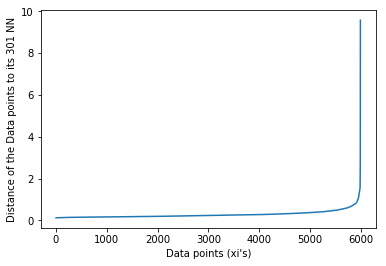

In [94]:
plt.plot(Datapoints,sortDist)
plt.xlabel("Data points (xi's)")
plt.ylabel("Distance of the Data points to its 301 NN")

In [95]:
db=DBSCAN(eps=0.2,min_samples=301)
labels=db.fit_predict(finalTFIDFw2v)

### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

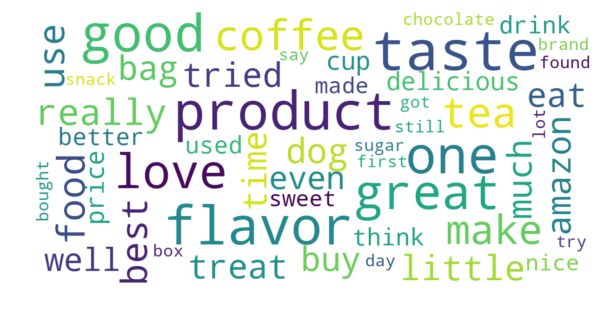

In [96]:
i=0
indice=np.where(labels==i)
for j in indice:
    Data=[]
    for k in j:
        Data.append(wordsList[k])
DataConv=list(chain.from_iterable(Data))
wordcloud2 = WordCloud( background_color='white',
max_words=50,
max_font_size=40, 
scale=3,
random_state=1).generate(' '.join(DataConv))
# Display the generated image:
fig = plt.figure(1, figsize=(10, 10))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()
        

# [6] Conclusions

In [97]:
from prettytable import PrettyTable
print("for K means clustering")
x = PrettyTable()
x.field_names = ["Vectorizer","Hyperparameter : K","Squared distance", "initializer",]
x.add_row(["BOW","2", "4.90","kmeans++"])
x.add_row(["TFIDF","5", "4.90","kmeans++"])
x.add_row(["avgW2v","5", "1700000","kmeans++"])
x.add_row(["TFIDFW2V","5", "1700000","kmeans++"])
print(x)
print("="*50)
print("for agglomerative clustering")
x = PrettyTable()
x.field_names = ["Vectorizer","Hyperparameter : K"," distance measure"]
x.add_row(["avgW2v","2,5,7", "eucledean"])
x.add_row(["TFIDFW2V","2,5,7", "eucledean"])
print(x)
print("="*50)
print("USING GridSearch L1 REGULARIZATION")
x = PrettyTable()
x.field_names = ["Vectorizer","epsilon","min_samples"]
x.add_row(["avgW2v","1.0", "301"])
x.add_row(["TFIDFW2V","0.2", "301"])
print(x)

for K means clustering
+------------+--------------------+------------------+-------------+
| Vectorizer | Hyperparameter : K | Squared distance | initializer |
+------------+--------------------+------------------+-------------+
|    BOW     |         2          |       4.90       |   kmeans++  |
|   TFIDF    |         5          |       4.90       |   kmeans++  |
|   avgW2v   |         5          |     1700000      |   kmeans++  |
|  TFIDFW2V  |         5          |     1700000      |   kmeans++  |
+------------+--------------------+------------------+-------------+
for agglomerative clustering
+------------+--------------------+-------------------+
| Vectorizer | Hyperparameter : K |  distance measure |
+------------+--------------------+-------------------+
|   avgW2v   |       2,5,7        |     eucledean     |
|  TFIDFW2V  |       2,5,7        |     eucledean     |
+------------+--------------------+-------------------+
USING GridSearch L1 REGULARIZATION
+------------+---------+-